In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


from IPython.display import clear_output

# Clear the output
clear_output(wait=True)
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/horse2zebra-dataset/metadata.csv
/kaggle/input/horse2zebra-dataset/testB/n02391049_80.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_400.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_3770.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_8830.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_8340.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_6690.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_10980.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_8140.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_3060.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_1220.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_1880.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_2220.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_10160.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_2510.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_890.jpg
/kaggle/input/horse2zebra-dataset/testB/n02391049_2810.jpg
/kaggle/inp

In [2]:
pip install tensorflow==2.15.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 74.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.3.2
    Uninstalling ml-dtypes-0.3.2:
      Successfully uninstalled ml-dtypes-0.3.2
  Attempting uninstall: keras
    Found existing installation: keras 3.3.3
    Uninstalling keras-3.3.3:
      Successfully uninstalled keras-3.3.3
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
 

In [3]:
!pip install tensorflow-addons


In [4]:
# Common
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from random import random

# Data
import tensorflow.image as tfi
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

# Model Layers
from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import concatenate
from keras.layers import ZeroPadding2D
from keras.layers import Conv2DTranspose
from tensorflow_addons.layers import InstanceNormalization

# Model Functions
from keras.models import Model
from keras.models import load_model
from keras.models import Sequential
from keras.initializers import RandomNormal

# Optimizers
from tensorflow.keras.optimizers import Adam

# Loss
from keras.losses import BinaryCrossentropy

# Model Viz
from tensorflow.keras.utils import plot_model

2024-11-13 08:43:53.342210: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-13 08:43:53.342280: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-13 08:43:53.343735: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our Tens

In [5]:
def show_image(image, title=None):
    '''
    The function takes in an image and plots it using Matplotlib.
    '''
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [6]:
root_horse_path = '../input/horse2zebra-dataset/trainA'
root_zebra_path = '../input/horse2zebra-dataset/trainB'
horse_paths = sorted(glob(root_horse_path + '/*.jpg'))[:1000]
zebra_paths = sorted(glob(root_zebra_path + '/*.jpg'))[:1000]

In [7]:
SIZE = 256
horse_images, zebra_images = np.zeros(shape=(len(horse_paths),SIZE,SIZE,3)), np.zeros(shape=(len(horse_paths),SIZE,SIZE,3))
for i,(horse_path, zebra_path) in tqdm(enumerate(zip(horse_paths, zebra_paths)), desc='Loading'):
    
    horse_image = img_to_array(load_img(horse_path))
    horse_image = tfi.resize(tf.cast(horse_image, tf.float32)/255., (SIZE, SIZE))
    
    zebra_image = img_to_array(load_img(zebra_path))
    zebra_image = tfi.resize(tf.cast(zebra_image,tf.float32)/255., (SIZE, SIZE))
    
    # as the data is unpaired so we don't have to worry about, positioning the images.
    
    horse_images[i] = horse_image
    zebra_images[i] = zebra_image

Loading: 1000it [00:21, 46.64it/s]


In [8]:
dataset = [horse_images, zebra_images]


In [9]:
def ResidualBlock(filters, layer, index):
#     init = RandomNormal(stddev=0.02)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv1".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization1".format(index))(x)
    x = ReLU(name="Block_{}_ReLU".format(index))(x)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv2".format(index))(x)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization2".format(index))(x)
    
    x = concatenate([x, layer], name="Block_{}_Merge".format(index))
    
    return x

In [10]:
def downsample(filters, layer, size=3, strides=2, activation=None, index=None, norm=True):
    x = Conv2D(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Encoder_{}_Conv".format(index))(layer)
    if norm:
        x = InstanceNormalization(axis=-1, name="Encoder_{}_Normalization".format(index))(x)
    if activation is not None:
        x = Activation(activation, name="Encoder_{}_Activation".format(index))(x)
    else:
        x = LeakyReLU( name="Encoder_{}_LeakyReLU".format(index))(x)
    return x

In [11]:
def upsample(filters, layer, size=3, strides=2, index=None):
    x = Conv2DTranspose(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Decoder_{}_ConvT".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Decoder_{}_Normalization".format(index))(x)
    x = ReLU( name="Encoder_{}_ReLU".format(index))(x)
    return x

In [12]:
def Generator(n_resnet=9, name="Generator"):
    
    inp_image = Input(shape=(SIZE, SIZE, 3), name="InputImage")         # 256 x 256 x3
    
    x = downsample(64, inp_image, size=7, strides=1, index=1)           # 256 x 256 x 64
    x = downsample(128, x, index=2)                                     # 128 x 128 x 128
    x = downsample(256, x, index=3)                                     # 64 x 64 x 256
    
    for i in range(n_resnet):
        x = ResidualBlock(256, x, index=i+4)                             # (64 x 64 x 256) x n_resnet
    
    x = upsample(128, x, index=13)                                       # 128 x 128 x 128
    x = upsample(64, x, index=14)                                        # 256 x 256 x 64
    x = downsample(3, x, size=7, strides=1, activation='tanh', index=15) # 256 x 256 x 3
    
    model = Model(
        inputs=inp_image,
        outputs=x,
        name=name
    )
    return model

In [13]:
def Discriminator(name='Discriminator'):
    init = RandomNormal(stddev=0.02)
    src_img = Input(shape=(SIZE, SIZE, 3), name="InputImage")     # 256 x 256 x 3
    x = downsample(64, src_img, size=4, strides=2, index=1, norm=False) # 128 x 128 x 64
    x = downsample(128, x, size=4, strides=2, index=2)            # 64 x 64 x 128
    x = downsample(256, x, size=4, strides=2, index=3)            # 32 x 32 x 256
    x = downsample(512, x, size=4, strides=2, index=4)            # 16 x 16 x 512
    x = downsample(512, x, size=4, strides=2, index=5)            # 8 x 8 x 512  # we can try out a different architecture with zero padding layer.
    patch_out = Conv2D(1, kernel_size=4, padding='same', kernel_initializer=init, use_bias=False)(x) # 8 x 8 x 1
    
    model = Model(
        inputs=src_img,
        outputs=patch_out,
        name=name
    )
    model.compile(
        loss='mse',
        optimizer=Adam(learning_rate=2e-4, beta_1=0.5),
        loss_weights=[0.5]
    )
    return model

In [14]:
def CombineModel(g_model1, g_model2, d_model, name):
    # train the Generator
    g_model1.trainable = True

    # Stop the Discriminator and 2nd Generator
    d_model.trainable = False
    g_model2.trainable = False
    
    # Adversarial Loss
    input_gen = Input(shape=(SIZE, SIZE, 3))
    gen_1_out = g_model1(input_gen)
    dis_out = d_model(gen_1_out)
    
    # Identity Loss
    input_id = Input(shape=(SIZE, SIZE, 3))
    output_id = g_model1(input_id)
    
    # Cycle Loss - Forward
    output_f = g_model2(gen_1_out)
    
    # Cycle Loss - Backward
    gen_2_out = g_model2(input_id)
    output_b = g_model1(gen_2_out)
    
    # Final Model 
    model = Model(
        inputs=[input_gen, input_id],
        outputs=[dis_out, output_id, output_f, output_b],
        name=name
    )
    model.compile(
        loss=['mse', 'mae', 'mae', 'mae'],
        loss_weights=[1,5,10,10],
        optimizer= Adam(learning_rate=2e-4, beta_1=0.5)
    )
    return model

In [15]:
def generate_real_samples(n_samples, dataset):
    ix = np.random.randint(0,dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones(shape=(n_samples, 8, 8, 1))
    return X, y

In [16]:
def generate_fake_samples(g_model, dataset):
    X = g_model.predict(dataset)
    y = np.zeros(shape=(len(dataset), 8, 8, 1))
    return X, y

In [17]:
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            selected.append(image)
        else:
            ix = np.random.randint(0,len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return np.asarray(selected)

In [18]:
def show_preds(g_AB, g_BA,n_images=1):
    for i in range(n_images):
        
        id = np.random.randint(len(horse_images))
        horse, zebra = horse_images[id], zebra_images[id]
        horse_pred, zebra_pred = g_BA.predict(tf.expand_dims(zebra,axis=0))[0], g_AB.predict(tf.expand_dims(horse,axis=0))[0]
        
        plt.figure(figsize=(10,8))
        
        plt.subplot(1,4,1)
        show_image(horse, title='Original Horse')
        
        plt.subplot(1,4,2)
        show_image(zebra_pred, title='Generated Zebra')
        
        plt.subplot(1,4,3)
        show_image(zebra, title='Original Zebra')
        
        plt.subplot(1,4,4)
        show_image(horse_pred, title='Genrated Horse')
        
        plt.tight_layout()
        plt.show()

In [19]:
def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=10, chunk=5):
    
    n_epochs, n_batch = epochs, 1
    
    trainA, trainB = dataset
    poolA, poolB = list(), list()
    
    # in simple words, we are going through the whole data.
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch
    
    for j in tqdm(range(1,epochs+1), desc="Epochs"):
        for i in range(n_steps):
            
            # Let's get some real data in hand.
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # use our generators to generate some fake data.
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)
            
            # create a pool of images. You can also understand it like a replay buffer.
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolA, X_fakeB)
            
            
            # Let's finally train the gen 2 and get the losses.
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )
            
            # It's time for our discriminator to win our generator.
            dA_loss_1 = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
            
            # one cycle is completed, let's move to second cycle.
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )
            
            # again, let's give some power to our discriminators.
            dB_loss_1 = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)

        if (j%chunk)==0:
            show_preds(gen_AB, gen_BA, n_images=1)
            gen_AB.save("GeneratorHtoZ_25e.h5")
            gen_BA.save("GeneratorZtoH_25e.h5")

In [20]:
# let's create our generators.
g_AB = Generator(name="GeneratorAB")
g_BA = Generator(name="GeneratorBA")

# here are the respective discriminators.
d_A = Discriminator(name="DiscriminatorA")
d_B = Discriminator(name="DiscriminatorB")

# finally, let's combine all of them.
c_AB = CombineModel(g_AB, g_BA, d_B, name="GanAB")
c_BA = CombineModel(g_BA, g_AB, d_A, name="GanBA")

In [21]:
 #train(d_A, d_B, g_AB, g_BA, c_AB, c_BA, epochs=25, chunk=5)


from IPython.display import clear_output

# Clear the output
clear_output(wait=True)


In [22]:
#Doing retraining at this point

In [23]:
def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=5, chunk=5, start_epoch=26):
    
    n_epochs, n_batch = epochs, 1
    trainA, trainB = dataset  # Load your dataset
    poolA, poolB = list(), list()
    
    # Compute batch per epoch
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch
    
    for j in tqdm(range(start_epoch, start_epoch + epochs), desc="Epochs"):
        for i in range(n_steps):
            
            # Generate real samples
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # Generate fake samples
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)
            
            # Update image pools
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolB, X_fakeB)
            
            # Train generator and discriminator models
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )
            
            dA_loss_1 = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
            
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )
            
            dB_loss_1 = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)

        # Save models and display predictions after each chunk
        if (j % chunk) == 0:
            show_preds(gen_AB, gen_BA, n_images=2)
            gen_AB.save(f"GeneratorHtoZ_{j}e.h5")
            gen_BA.save(f"GeneratorZtoH_{j}e.h5")


In [22]:
# Load the saved models
g_AB = load_model('../input/cyclegan4/GeneratorHtoZ_80e.h5', custom_objects={'InstanceNormalization': InstanceNormalization})
g_BA = load_model('../input/cyclegan4/GeneratorZtoH_80e.h5', custom_objects={'InstanceNormalization': InstanceNormalization})

print("Models loaded successfully.")


Models loaded successfully.


In [25]:
# Resume training from epoch 41 to epoch 55
#train(d_A, d_B, g_AB, g_BA, c_AB, c_BA, epochs=20, chunk=5, start_epoch=81)

from IPython.display import clear_output

# Clear the output
clear_output(wait=True)

In [23]:
# Test Data
root_test_horse_path = '../input/horse2zebra-dataset/testA'
root_test_zebra_path = '../input/horse2zebra-dataset/testB'
test_horse_paths = sorted(glob(root_test_horse_path + '/*.jpg'))[:50]  # Load a subset of test images
test_zebra_paths = sorted(glob(root_test_zebra_path + '/*.jpg'))[:50]

test_horse_images, test_zebra_images = np.zeros(shape=(len(test_horse_paths), SIZE, SIZE, 3)), np.zeros(shape=(len(test_zebra_paths), SIZE, SIZE, 3))

for i, (horse_path, zebra_path) in tqdm(enumerate(zip(test_horse_paths, test_zebra_paths)), desc='Loading Test Data'):
    horse_image = img_to_array(load_img(horse_path))
    horse_image = tfi.resize(tf.cast(horse_image, tf.float32) / 255., (SIZE, SIZE))
    
    zebra_image = img_to_array(load_img(zebra_path))
    zebra_image = tfi.resize(tf.cast(zebra_image, tf.float32) / 255., (SIZE, SIZE))
    
    test_horse_images[i] = horse_image
    test_zebra_images[i] = zebra_image


Loading Test Data: 50it [00:01, 40.10it/s]


In [24]:
def test_models(g_AB, g_BA, test_horses, test_zebras, n_images=5):
    for i in range(n_images):
        idx = np.random.randint(len(test_horses))
        horse, zebra = test_horses[idx], test_zebras[idx]
        
        # Generate images
        generated_zebra = g_AB.predict(tf.expand_dims(horse, axis=0))[0]
        generated_horse = g_BA.predict(tf.expand_dims(zebra, axis=0))[0]
        
        # Plotting
        plt.figure(figsize=(12, 8))
        
        plt.subplot(1, 4, 1)
        show_image(horse, title='Original Horse')
        
        plt.subplot(1, 4, 2)
        show_image(generated_zebra, title='Generated Zebra')
        
        plt.subplot(1, 4, 3)
        show_image(zebra, title='Original Zebra')
        
        plt.subplot(1, 4, 4)
        show_image(generated_horse, title='Generated Horse')
        
        plt.tight_layout()
        plt.show()


1/1 [==============================] - 1s 975ms/step


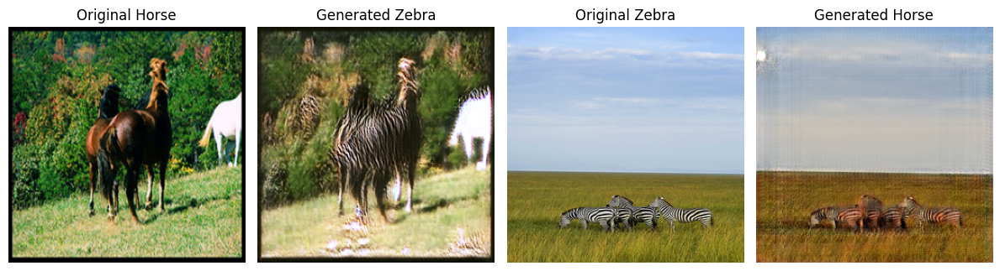

1/1 [==============================] - 0s 24ms/step


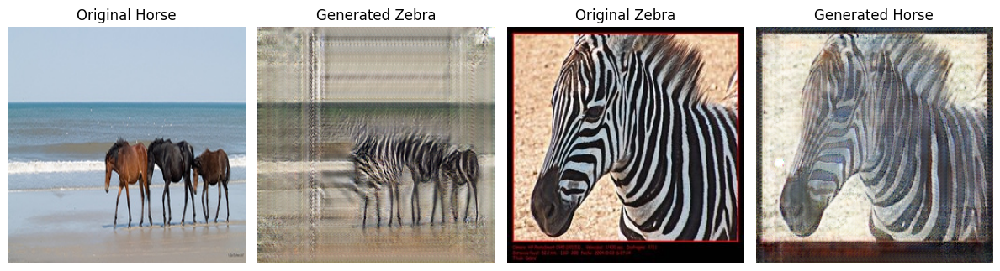

1/1 [==============================] - 0s 24ms/step


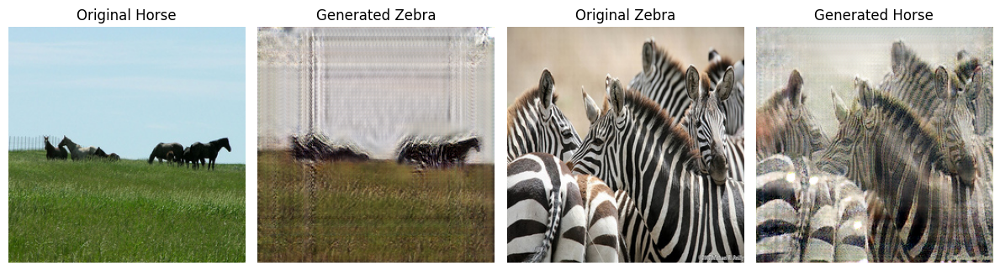

1/1 [==============================] - 0s 24ms/step


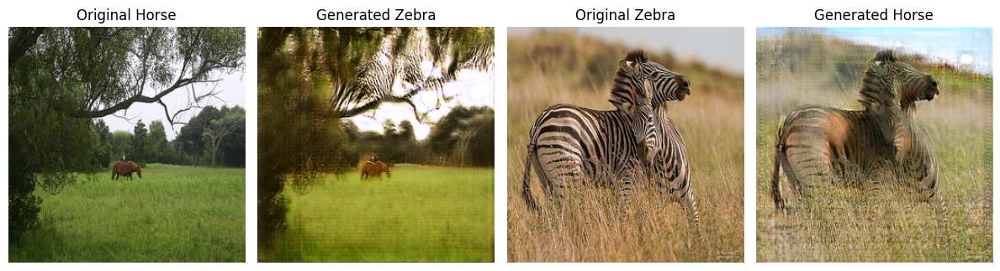

1/1 [==============================] - 0s 22ms/step


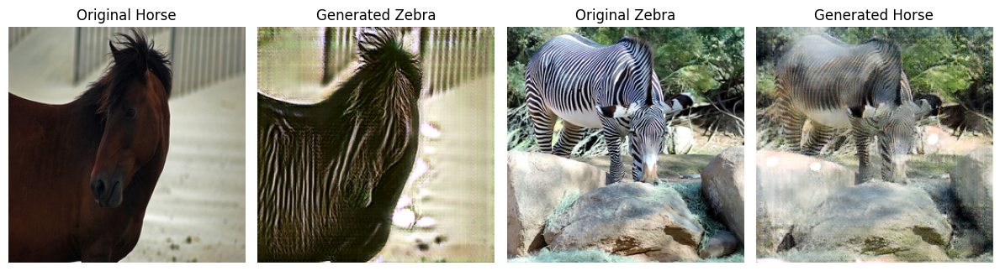

1/1 [==============================] - 0s 23ms/step


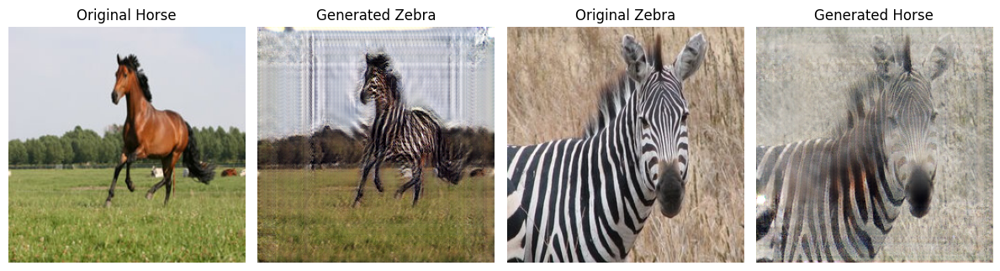

1/1 [==============================] - 0s 24ms/step


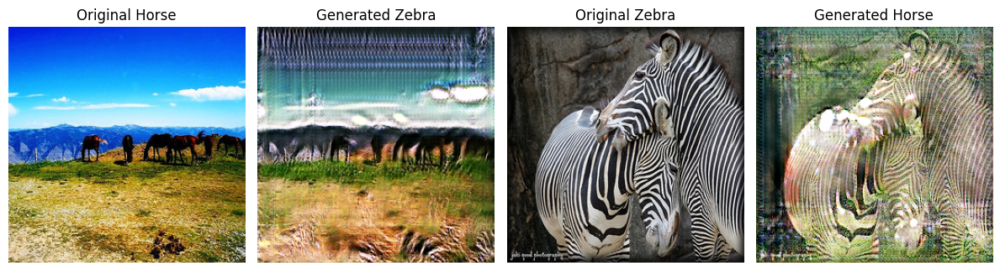

1/1 [==============================] - 0s 22ms/step


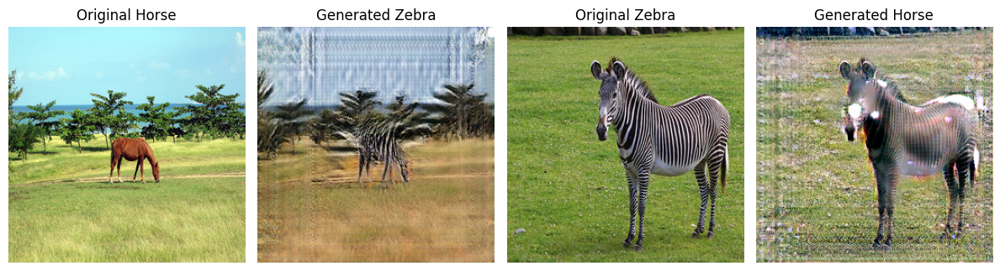

1/1 [==============================] - 0s 24ms/step


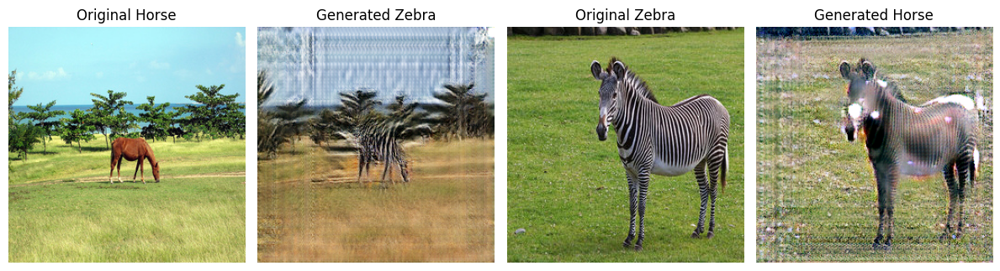

1/1 [==============================] - 0s 24ms/step


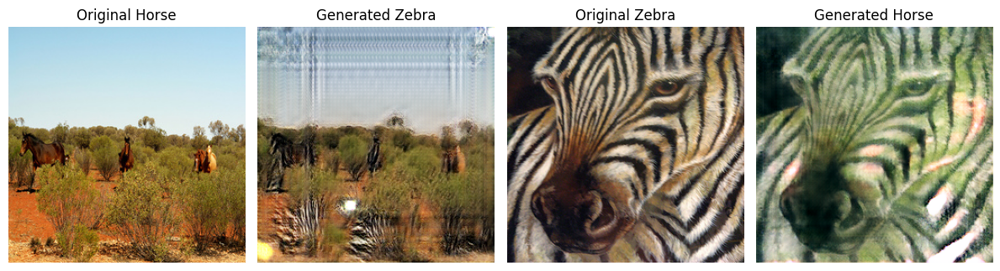

1/1 [==============================] - 0s 25ms/step


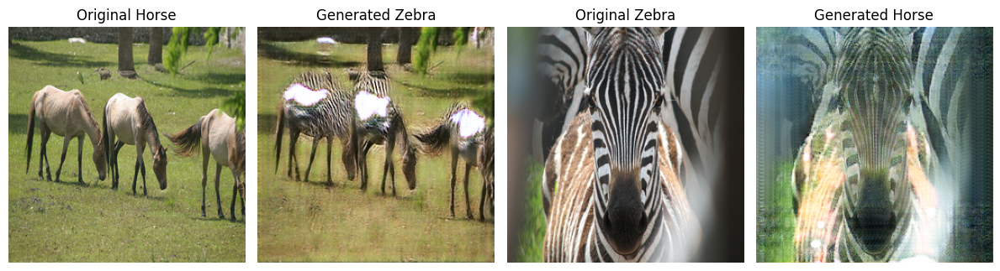

1/1 [==============================] - 0s 24ms/step


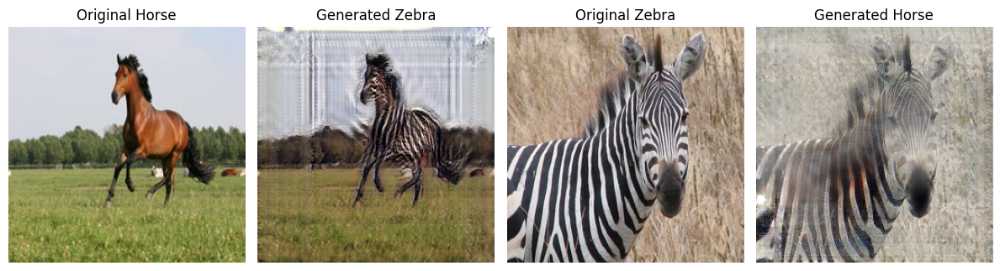

In [25]:
test_models(g_AB, g_BA, test_horse_images, test_zebra_images, n_images=12)


In [26]:
from  skimage.metrics import structural_similarity as ssim
import cv2  # OpenCV for image resizing

def evaluate_quality(original, generated, win_size=3):
    # Ensure both images are the same size
    if original.shape != generated.shape:
        generated = cv2.resize(generated, (original.shape[1], original.shape[0]))
    
    score = ssim(original, generated, multichannel=True, win_size=win_size)
    return score

# Example for a specific image
horse_image = test_horse_images[8]
generated_zebra_image = g_AB.predict(tf.expand_dims(horse_image, axis=0))[0]

# Ensure the images are in the range [0, 1] if they aren't already
horse_image = (horse_image * 255).astype(np.uint8)
generated_zebra_image = (generated_zebra_image * 255).astype(np.uint8)

ssim_score = evaluate_quality(horse_image, generated_zebra_image)
print(f'SSIM Score: {ssim_score:.4f}')

1/1 [==============================] - 0s 27ms/step
SSIM Score: 0.2233


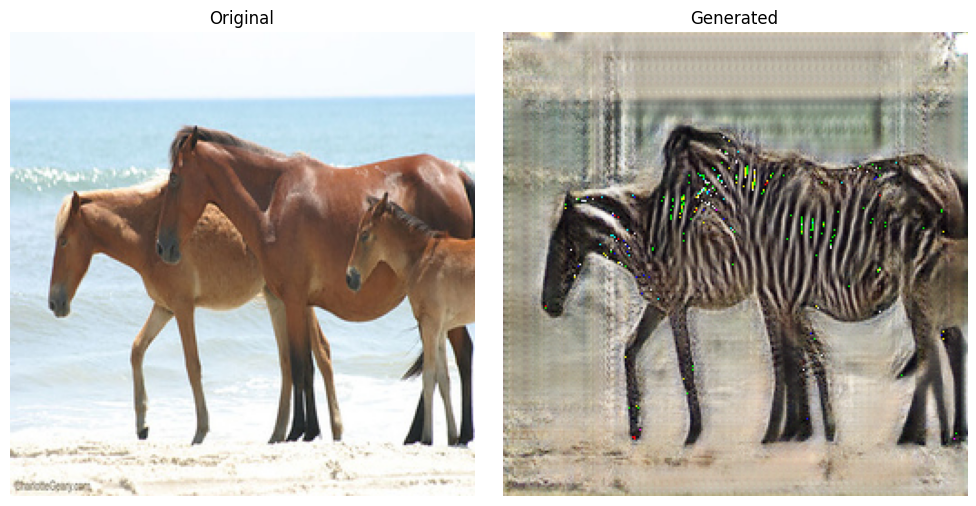

In [27]:
# Function to display images side by side
def display_images(original, generated, title1="Original", title2="Generated"):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    show_image(original, title=title1)
    plt.subplot(1, 2, 2)
    show_image(generated, title=title2)
    plt.tight_layout()
    plt.show()

# Display the images
display_images(horse_image, generated_zebra_image)
